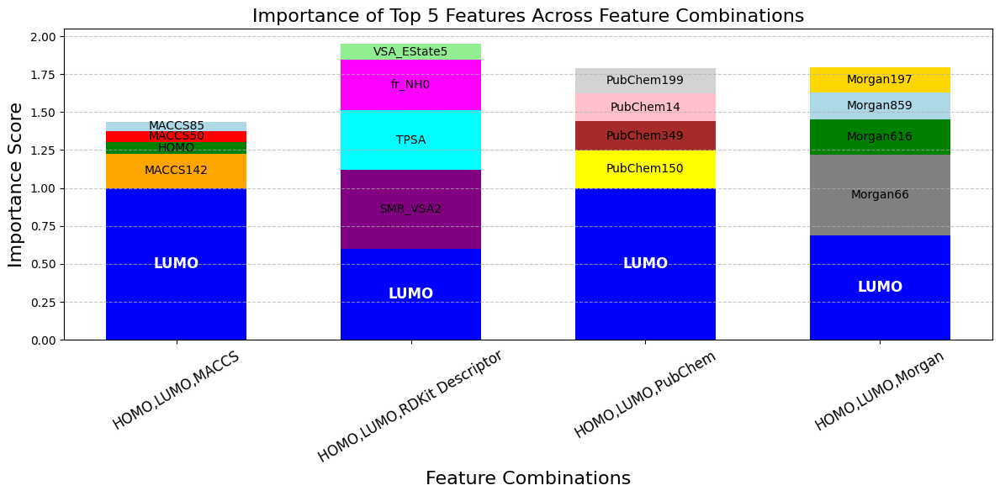

In [10]:

import matplotlib.pyplot as plt
import numpy as np
# Data for LUMO and other features (separated for each category)
categories = ['HOMO,LUMO,MACCS', 'HOMO,LUMO,RDKit Descriptor', 'HOMO,LUMO,PubChem', 'HOMO,LUMO,Morgan']
lumo_scores = [1.0, 0.6, 1.0, 0.69]
other_features = [
    [0.227385, 0.076145, 0.073294,0.060529],  # MACCS
    [0.518573,0.395019,0.330476,0.106585],  # RDKit Descriptor
    [0.247003,0.191454,0.182956,0.171082],  # PubChem
    [0.527613,0.234781,0.177715,0.166472]   # Morgan
]
other_feature_names = [
    ['MACCS142', 'HOMO', 'MACCS50','MACCS85'],
    ['SMR_VSA2', 'TPSA', 'fr_NH0','VSA_EState5'],
    ['PubChem150', 'PubChem349', 'PubChem14','PubChem199'],
    ['Morgan66', 'Morgan616', 'Morgan859','Morgan197']
]

# Colors for LUMO and other features
lumo_color = 'blue'
category_colors = [
    ['orange', 'green', 'red', 'lightblue'],  # MACCS
    ['purple', 'cyan', 'magenta', 'lightgreen'],  # RDKit Descriptor
    ['yellow', 'brown', 'pink', 'lightgray'],  # PubChem
    ['gray', 'green', 'lightblue', 'gold']  # Morgan
]
# Plot setup
x = np.arange(len(categories))
bar_width = 0.6
fig, ax = plt.subplots(figsize=(12, 6))

# Plot bars for LUMO
for i, category in enumerate(categories):
    ax.bar(
        x[i], lumo_scores[i], bar_width,
        label="LUMO" if i == 0 else "", color=lumo_color
    )

# Add stacked bars for other features with distinct colors and labels
for i, category in enumerate(categories):
    bottom_value = lumo_scores[i]  # Start stacking from LUMO's value
    for j, score in enumerate(other_features[i]):
        ax.bar(
            x[i], score, bar_width,
            label=f"{other_feature_names[i][j]}" if i == 0 else "",
            color=category_colors[i][j], bottom=bottom_value
        )
        bottom_value += score

# Adding labels and titles
ax.set_xlabel('Feature Combinations', fontsize=16)
ax.set_ylabel('Importance Score', fontsize=16)
ax.set_title('Importance of Top 5 Features Across Feature Combinations', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=12, rotation=30)

# Annotate LUMO bars with "LUMO"
for i, category in enumerate(categories):
    ax.text(
        x[i], lumo_scores[i] / 2,
        "LUMO", ha='center', va='center', fontsize=12, color='white',weight='bold'
    )

# Annotate stacked bars with feature names
for i, category in enumerate(categories):
    bottom_value = lumo_scores[i]
    for j, score in enumerate(other_features[i]):
        ax.text(
            x[i], bottom_value + score / 2,
            f"{other_feature_names[i][j]}", ha='center', va='center', fontsize=10, color='black'
        )
        bottom_value += score

# Show grid for clarity
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()


In [16]:
import pandas as pd
from IPython.display import display

# Example data
data = {
    'Model': ['Random Forest (RF)', 'Decision Tree', 'XGBoost', 'SVR', 'ElasticNet'],
    'Train R² (Mean ± Std)': [
        '0.787 ± 0.012', 
        '0.509 ± 0.089', 
        '0.889 ± 0.021', 
        '0.677 ± 0.035', 
        '-0.002 ± 0.001'
    ],
    'Train RMSE (Mean ± Std)': [
        '0.458 ± 0.014', 
        '0.686 ± 0.059', 
        '0.305 ± 0.028', 
        '0.555 ± 0.031', 
        '1.01 ± 0.001'
    ],
    'Test R²': [
        '0.775', 
        '0.491', 
        '0.825', 
        '0.712', 
        '-0.001'
    ],
    'Test RMSE': [
        '0.502', 
        '0.755', 
        '0.443', 
        '0.57', 
        '1.058'
    ],
}

# Create DataFrame
performance_table = pd.DataFrame(data)

# Display the table in Jupyter Notebook
display(performance_table)


,Model,Train R² (Mean ± Std),Train RMSE (Mean ± Std),Test R²,Test RMSE
0,Random Forest (RF),0.787 ± 0.012,0.458 ± 0.014,0.775,0.502
1,Decision Tree,0.509 ± 0.089,0.686 ± 0.059,0.491,0.755
2,XGBoost,0.889 ± 0.021,0.305 ± 0.028,0.825,0.443
3,SVR,0.677 ± 0.035,0.555 ± 0.031,0.712,0.57
4,ElasticNet,-0.002 ± 0.001,1.01 ± 0.001,-0.001,1.058


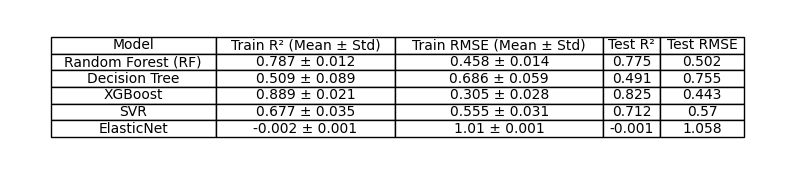

'model_performance_table.png'

In [17]:

# Plot settings for the table
fig, ax = plt.subplots(figsize=(10, 2))  # Adjust size for better visibility
ax.axis('off')  # Hide axes

# Create the table
table = ax.table(
    cellText=performance_table.values,
    colLabels=performance_table.columns,
    cellLoc='center',
    loc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(performance_table.columns))))

# Save the table as an image
output_path = "model_performance_table.png"
plt.savefig(output_path, bbox_inches='tight', dpi=300)
plt.show()

output_path

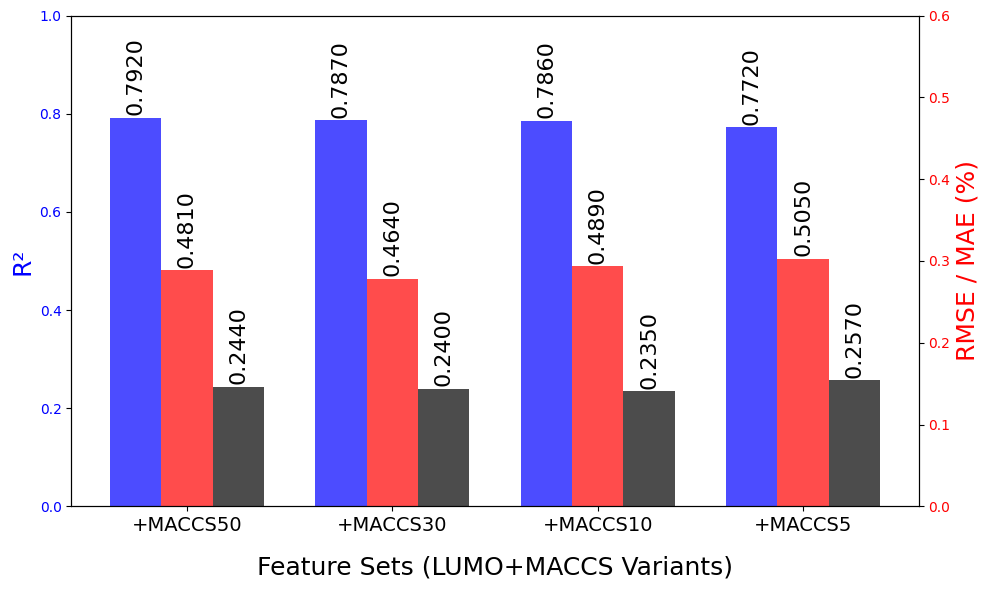

In [29]:
import matplotlib.pyplot as plt
import numpy as np

categories = ['+MACCS50', '+MACCS30', '+MACCS10', '+MACCS5']

rmse_values = [0.481, 0.464, 0.489,0.505]

mae_values = [0.244, 0.240,0.235,0.257]
r2_values = [0.792, 0.787,0.786,0.772]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.25  # Width of the bars

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot R² values
bars_r2 = ax1.bar(x - width, r2_values, width, label='R²', color='blue', alpha=0.7)
# Plot RMSE values
bars_rmse = ax1.bar(x, rmse_values, width, label='RMSE', color='red', alpha=0.7)
# Plot MAE values
bars_mae = ax1.bar(x + width, mae_values, width, label='MAE', color='black', alpha=0.7)

# Customize the primary y-axis
ax1.set_xlabel('Feature Sets (LUMO+MACCS Variants)', fontsize=18, labelpad=15)  # Add label padding
ax1.set_ylabel('R²', fontsize=18, color='blue')
ax1.set_ylim(0, 1)
ax1.set_xticks(x)
ax1.set_xticklabels(categories, fontsize=14)
ax1.tick_params(axis='y', labelcolor='blue')

# Add secondary y-axis for RMSE and MAE
ax2 = ax1.twinx()
ax2.set_ylabel('RMSE / MAE (%)', fontsize=18, color='red')
ax2.set_ylim(0, 0.6)
ax2.tick_params(axis='y', labelcolor='red')

# Add value annotations
for bars, values in zip([bars_r2, bars_rmse, bars_mae], [r2_values, rmse_values, mae_values]):
    for bar, value in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005, f'{value:.4f}', 
                 ha='center', va='bottom', fontsize=16,rotation=90)

# # Move legend to the bottom and make it horizontal
# fig.legend(
#     loc='lower center',
#     bbox_to_anchor=(0.5, -0.1),  # Position the legend below the graph
#     ncol=3,  # Number of columns for horizontal alignment
#     fontsize=12,
# )

# Adjust layout
fig.tight_layout()

# Show the plot
plt.show()


# LUMO + HOMO 

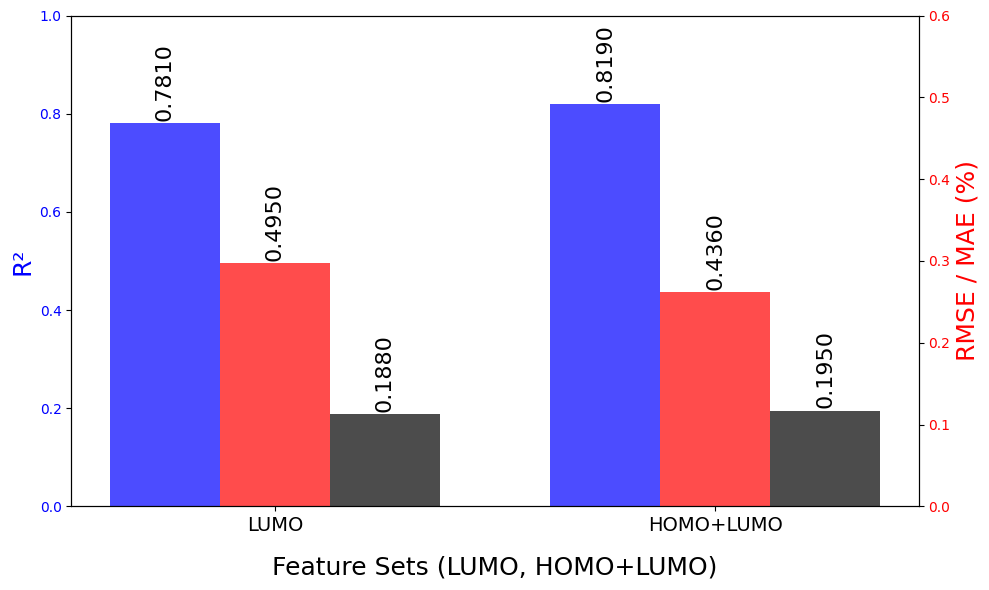

In [32]:

categories = ['LUMO', 'HOMO+LUMO']
r2_values = [0.781, 0.819]
rmse_values = [0.495, 0.436]
mae_values = [0.188,  0.195]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.25  # Width of the bars

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot R² values
bars_r2 = ax1.bar(x - width, r2_values, width, label='R²', color='blue', alpha=0.7)
# Plot RMSE values
bars_rmse = ax1.bar(x, rmse_values, width, label='RMSE', color='red', alpha=0.7)
# Plot MAE values
bars_mae = ax1.bar(x + width, mae_values, width, label='MAE', color='black', alpha=0.7)

# Customize the primary y-axis
ax1.set_xlabel('Feature Sets (LUMO, HOMO+LUMO)', fontsize=18, labelpad=15)  # Add label padding
ax1.set_ylabel('R²', fontsize=18, color='blue')
ax1.set_ylim(0, 1)
ax1.set_xticks(x)
ax1.set_xticklabels(categories, fontsize=14)
ax1.tick_params(axis='y', labelcolor='blue')

# Add secondary y-axis for RMSE and MAE
ax2 = ax1.twinx()
ax2.set_ylabel('RMSE / MAE (%)', fontsize=18, color='red')
ax2.set_ylim(0, 0.6)
ax2.tick_params(axis='y', labelcolor='red')

# Add value annotations
for bars, values in zip([bars_r2, bars_rmse, bars_mae], [r2_values, rmse_values, mae_values]):
    for bar, value in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005, f'{value:.4f}', 
                 ha='center', va='bottom', fontsize=16,rotation=90)

# # Move legend to the bottom and make it horizontal
# fig.legend(
#     loc='lower center',
#     bbox_to_anchor=(0.5, -0.1),  # Position the legend below the graph
#     ncol=3,  # Number of columns for horizontal alignment
#     fontsize=12,
# )

# Adjust layout
fig.tight_layout()

# Show the plot
plt.show()

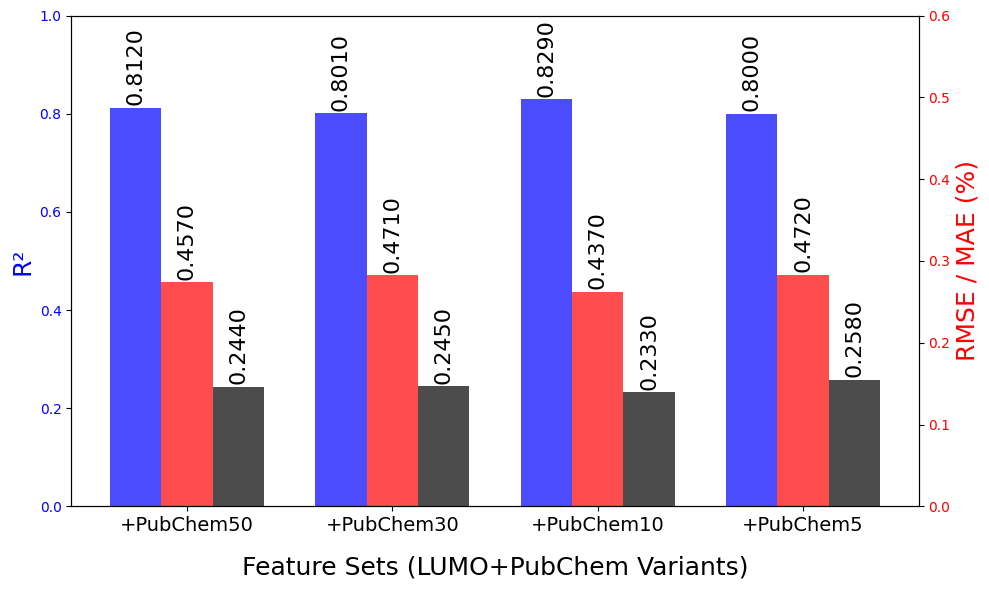

In [31]:

categories = ['+PubChem50', '+PubChem30', '+PubChem10', '+PubChem5']
rmse_values = [0.457,0.471,0.437,0.472]
mae_values = [ 0.244,0.245, 0.233,  0.258]
r2_values = [0.812,0.801, 0.829,0.80]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.25  # Width of the bars

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot R² values
bars_r2 = ax1.bar(x - width, r2_values, width, label='R²', color='blue', alpha=0.7)
# Plot RMSE values
bars_rmse = ax1.bar(x, rmse_values, width, label='RMSE', color='red', alpha=0.7)
# Plot MAE values
bars_mae = ax1.bar(x + width, mae_values, width, label='MAE', color='black', alpha=0.7)

# Customize the primary y-axis
ax1.set_xlabel('Feature Sets (LUMO+PubChem Variants)', fontsize=18, labelpad=15)  # Add label padding
ax1.set_ylabel('R²', fontsize=18, color='blue')
ax1.set_ylim(0, 1)
ax1.set_xticks(x)
ax1.set_xticklabels(categories, fontsize=14)
ax1.tick_params(axis='y', labelcolor='blue')

# Add secondary y-axis for RMSE and MAE
ax2 = ax1.twinx()
ax2.set_ylabel('RMSE / MAE (%)', fontsize=18, color='red')
ax2.set_ylim(0, 0.6)
ax2.tick_params(axis='y', labelcolor='red')

# Add value annotations
for bars, values in zip([bars_r2, bars_rmse, bars_mae], [r2_values, rmse_values, mae_values]):
    for bar, value in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005, f'{value:.4f}', 
                 ha='center', va='bottom', fontsize=16,rotation=90)

# # Move legend to the bottom and make it horizontal
# fig.legend(
#     loc='lower center',
#     bbox_to_anchor=(0.5, -0.1),  # Position the legend below the graph
#     ncol=3,  # Number of columns for horizontal alignment
#     fontsize=12,
# )

# Adjust layout
fig.tight_layout()

# Show the plot
plt.show()


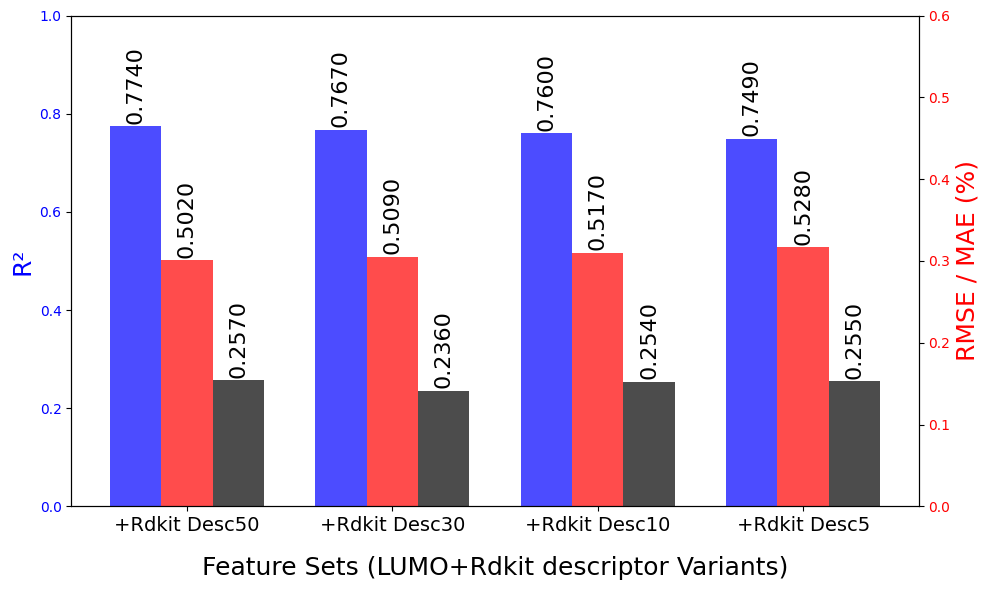

In [33]:

categories = ['+Rdkit Desc50', '+Rdkit Desc30', '+Rdkit Desc10', '+Rdkit Desc5']
rmse_values = [0.502,0.509,0.517,0.528]
mae_values = [0.257,0.236, 0.254,0.255]
r2_values = [ 0.774, 0.767,0.760,0.749]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.25  # Width of the bars

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot R² values
bars_r2 = ax1.bar(x - width, r2_values, width, label='R²', color='blue', alpha=0.7)
# Plot RMSE values
bars_rmse = ax1.bar(x, rmse_values, width, label='RMSE', color='red', alpha=0.7)
# Plot MAE values
bars_mae = ax1.bar(x + width, mae_values, width, label='MAE', color='black', alpha=0.7)

# Customize the primary y-axis
ax1.set_xlabel('Feature Sets (LUMO+Rdkit descriptor Variants)', fontsize=18, labelpad=15)  # Add label padding
ax1.set_ylabel('R²', fontsize=18, color='blue')
ax1.set_ylim(0, 1)
ax1.set_xticks(x)
ax1.set_xticklabels(categories, fontsize=14)
ax1.tick_params(axis='y', labelcolor='blue')

# Add secondary y-axis for RMSE and MAE
ax2 = ax1.twinx()
ax2.set_ylabel('RMSE / MAE (%)', fontsize=18, color='red')
ax2.set_ylim(0, 0.6)
ax2.tick_params(axis='y', labelcolor='red')

# Add value annotations
for bars, values in zip([bars_r2, bars_rmse, bars_mae], [r2_values, rmse_values, mae_values]):
    for bar, value in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005, f'{value:.4f}', 
                 ha='center', va='bottom', fontsize=16,rotation=90)

# # Move legend to the bottom and make it horizontal
# fig.legend(
#     loc='lower center',
#     bbox_to_anchor=(0.5, -0.1),  # Position the legend below the graph
#     ncol=3,  # Number of columns for horizontal alignment
#     fontsize=12,
# )

# Adjust layout
fig.tight_layout()

# Show the plot
plt.show()


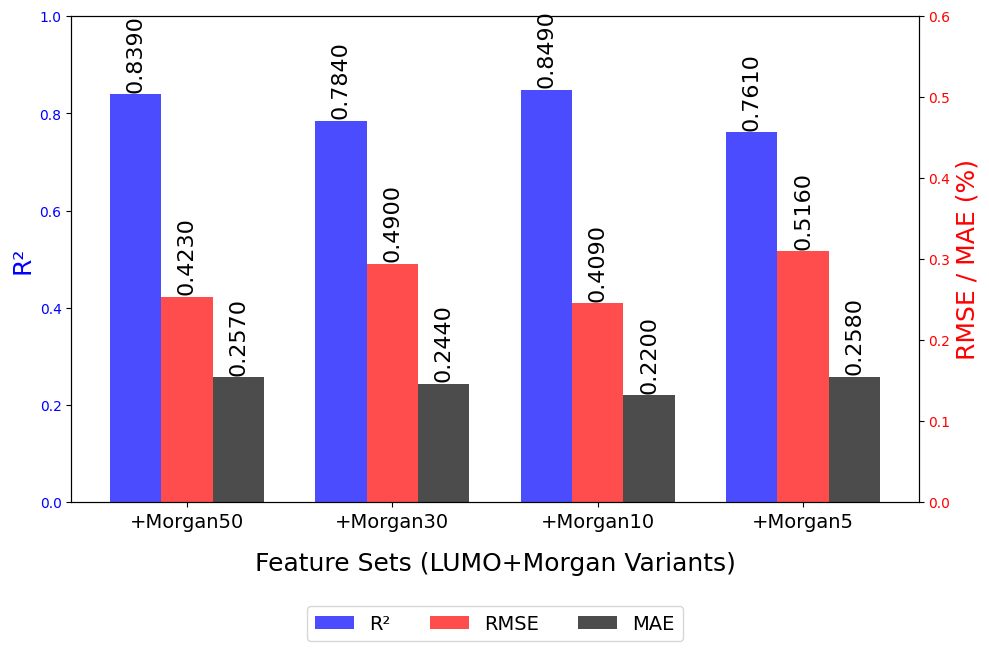

In [34]:
categories = ['+Morgan50', '+Morgan30', '+Morgan10', '+Morgan5']
rmse_values = [0.423, 0.490,0.409, 0.516]
mae_values = [ 0.257,0.244,0.220,0.258]
r2_values = [0.839,0.784,0.849, 0.761]

# Set positions for the bars
x = np.arange(len(categories))
width = 0.25  # Width of the bars

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot R² values
bars_r2 = ax1.bar(x - width, r2_values, width, label='R²', color='blue', alpha=0.7)
# Plot RMSE values
bars_rmse = ax1.bar(x, rmse_values, width, label='RMSE', color='red', alpha=0.7)
# Plot MAE values
bars_mae = ax1.bar(x + width, mae_values, width, label='MAE', color='black', alpha=0.7)

# Customize the primary y-axis
ax1.set_xlabel('Feature Sets (LUMO+Morgan Variants)', fontsize=18, labelpad=15)  # Add label padding
ax1.set_ylabel('R²', fontsize=18, color='blue')
ax1.set_ylim(0, 1)
ax1.set_xticks(x)
ax1.set_xticklabels(categories, fontsize=14)
ax1.tick_params(axis='y', labelcolor='blue')

# Add secondary y-axis for RMSE and MAE
ax2 = ax1.twinx()
ax2.set_ylabel('RMSE / MAE (%)', fontsize=18, color='red')
ax2.set_ylim(0, 0.6)
ax2.tick_params(axis='y', labelcolor='red')

# Add value annotations
for bars, values in zip([bars_r2, bars_rmse, bars_mae], [r2_values, rmse_values, mae_values]):
    for bar, value in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005, f'{value:.4f}', 
                 ha='center', va='bottom', fontsize=16,rotation=90)

# Move legend to the bottom and make it horizontal
fig.legend(
    loc='lower center',
    bbox_to_anchor=(0.5, -0.1),  # Position the legend below the graph
    ncol=3,  # Number of columns for horizontal alignment
    fontsize=14,
)

# Adjust layout
fig.tight_layout()

# Show the plot
plt.show()


# similar figures trained with RF will be provided in the supplementary document 

# Visualize important fingerprints on relevant molecues or individually 

In [4]:
# concatenate SMILES to Data/Data_processed/HOPV15_new/Fingerprint/Morgan_remv_linerly_dep.csv
import pandas as pd
df_smiles = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/no_negative_updated.csv')
df_morgan = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_remv_linerly_dep.csv')
morgan_smiles = pd.merge(df_smiles,df_morgan,on=['PCE','LUMO'],how='inner')
morgan_smiles.to_csv('morgan_smiles.csv')
print(morgan_smiles.columns)
print(morgan_smiles.shape) 



Index(['Acceptor', 'Architecture', 'Construction ', 'SMILES', 'HOMO', 'LUMO',
       'Gap', 'PCE', 'Voc', 'Joc',
       ...
       '1008', '1009', '1011', '1012', '1015', '1017', '1018', '1019', '1020',
       '1023'],
      dtype='object', length=642)
(346, 642)


In [5]:
# visualize the bit individually 
import os
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
import ast

# Directory to save images
output_dir = "/home/yxy220016/OPV project/Random Forest/Data/Images"
os.makedirs(output_dir, exist_ok=True)

def find_and_visualize_important_bits(df, important_bits):
    """
    Finds all SMILES with important bits, visualizes them with row index captions,
    and saves images to disk with filenames that include bit information.

    Parameters:
    - df: DataFrame containing 'SMILES' column with SMILES strings and 'Bit_info' with bit positions.
    - important_bits: List of important bit positions to search for.

    Returns:
    - A dictionary of SMILES to image file paths and associated bits for molecules containing important bits.
    """
    smiles_images = {}

    for index, row in df.iterrows():
        smiles = row['smile']
        mol = Chem.MolFromSmiles(smiles)
        
        try:
            bit_info = ast.literal_eval(row['bit_info'])
        except ValueError:
            print(f"Could not parse Bit_info for SMILES: {smiles}")
            continue
        
        # Find bits that are present in this molecule and in the list of important bits
        bits_present = [bit for bit in important_bits if bit in bit_info]

        if bits_present:
            # Create a filename that includes the row index and the bits
            bits_str = "_".join(map(str, bits_present))
            img_path = os.path.join(output_dir, f"mol_{index}_bits_{bits_str}.png")
            
            # Draw the molecule and save the image
            img = Draw.MolToImage(mol, legend=f"Row Index: {index}, Bits: {bits_str}")
            img.save(img_path)
            
            # Store the SMILES, image path, and the associated bits
            smiles_images[smiles] = {"image_path": img_path, "bits": bits_present}

    return smiles_images

# Load your DataFrame
df = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info.csv')

# Update the important bits to [790, 722]
important_bits = [722]

# Run the function and update the DataFrame with image paths and associated bits
smiles_images = find_and_visualize_important_bits(df, important_bits)
df['image_path'] = df['smile'].map(lambda x: smiles_images.get(x, {}).get("image_path"))
df['associated_bits'] = df['smile'].map(lambda x: smiles_images.get(x, {}).get("bits"))

# Save the updated DataFrame
df.to_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info_with_images_and_bits.csv', index=False)


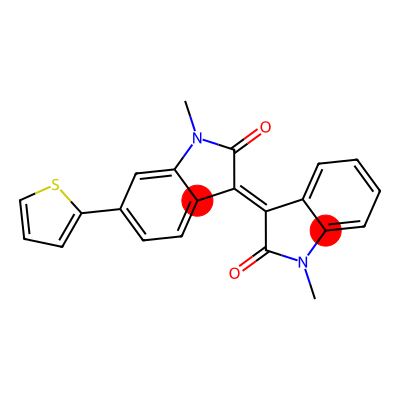

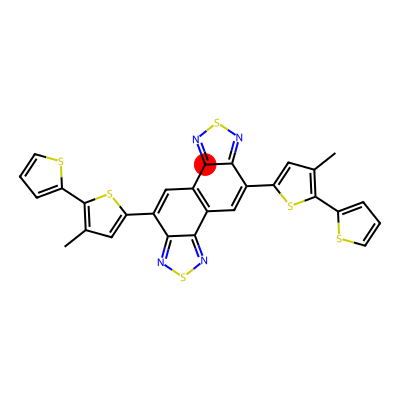

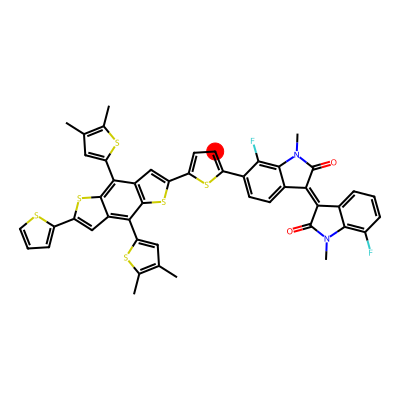

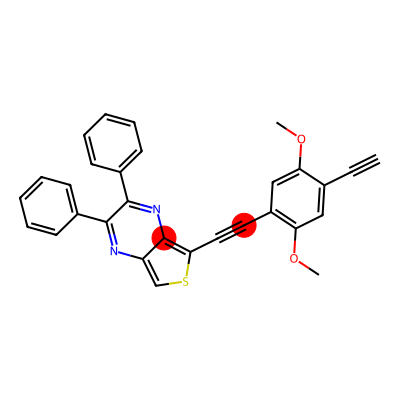

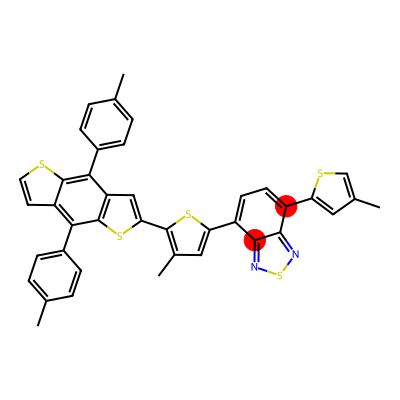

...

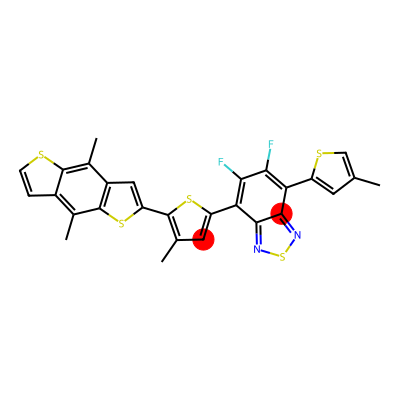

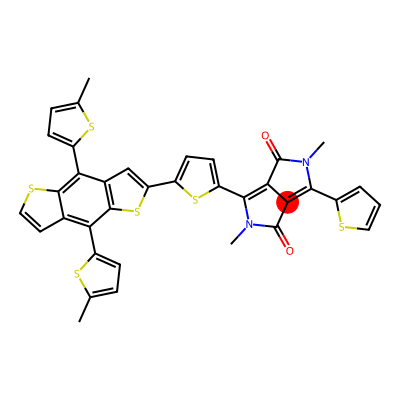

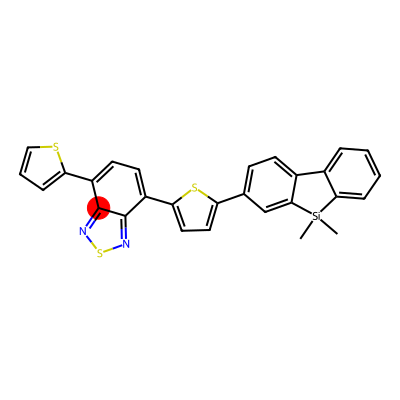

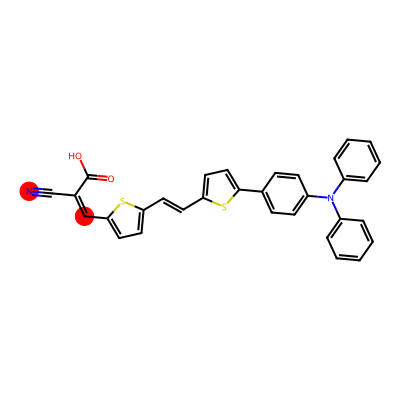

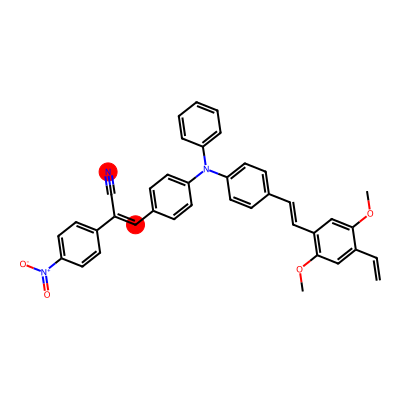

In [16]:
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import SVG, display
import pandas as pd
import ast

def find_and_display_important_bits(df, important_bits):
    """
    Finds all SMILES with important bits, visualizes them with row index captions,
    highlights the substructures corresponding to the bits with larger circles,
    and displays the structures in a Jupyter Notebook.

    Parameters:
    - df: DataFrame containing 'SMILES' column with SMILES strings and 'Bit_info' with bit positions.
    - important_bits: List of important bit positions to search for.

    Returns:
    - A list of dictionaries containing SMILES, SVG images, and associated bits for visualization.
    """
    displayed_smiles = []

    for index, row in df.iterrows():
        smiles = row['smile']
        mol = Chem.MolFromSmiles(smiles)
        
        try:
            bit_info = ast.literal_eval(row['bit_info'])
        except ValueError:
            print(f"Could not parse Bit_info for SMILES: {smiles}")
            continue
        
        # Find bits that are present in this molecule and in the list of important bits
        bits_present = [bit for bit in important_bits if bit in bit_info]

        if bits_present:
            # Highlight atoms for all present bits
            highlight_atoms = []
            highlight_colors = {}  # Dictionary for custom bit-specific colors

            for bit in bits_present:
                atom_info = bit_info[bit][0][0]  # Extract atom indices for the bit
                if isinstance(atom_info, int):  # Single atom index
                    highlight_atoms.append(atom_info)
                    highlight_colors[atom_info] = (1, 0, 0)  # Red circle for the atom
                else:  # List of atom indices
                    highlight_atoms.extend(atom_info)
                    for atom in atom_info:
                        highlight_colors[atom] = (1, 0, 0)  # Red circle for all atoms in this bit

            # Create the legend for the molecule
            bits_str = ", ".join(map(str, bits_present))
            legend = f"Row Index: {index}\nBits: {bits_str}"

            # Advanced drawing options to increase highlight circle size
            drawer = Draw.rdMolDraw2D.MolDraw2DSVG(400, 400)
            drawer.drawOptions().highlightRadius = 0.6  # Increase circle size
            Draw.rdDepictor.Compute2DCoords(mol)
            drawer.DrawMolecule(
                mol, 
                highlightAtoms=highlight_atoms, 
                highlightAtomColors=highlight_colors
            )
            drawer.FinishDrawing()

            # Render the SVG and display it
            svg = drawer.GetDrawingText()
            display(SVG(svg))  # Correct usage for displaying SVG

            # Store the data for reference if needed
            displayed_smiles.append({"smiles": smiles, "svg": svg, "bits": bits_present})

    return displayed_smiles

# Load your DataFrame
df = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info.csv')

# Define the important bits (e.g., including bit 722)
important_bits = [700,722,790,870]

# Run the function to display the molecules
displayed_smiles = find_and_display_important_bits(df, important_bits)


Top 20% PCE threshold: 2.58


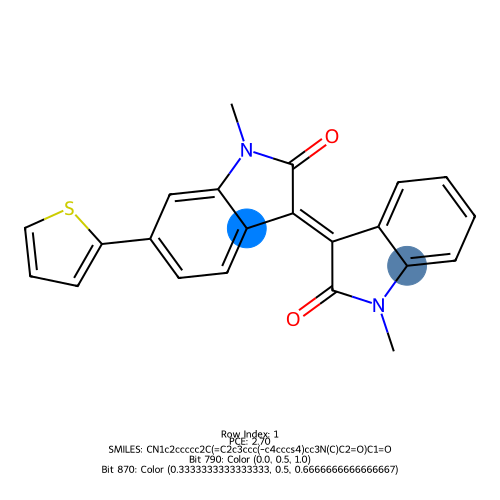

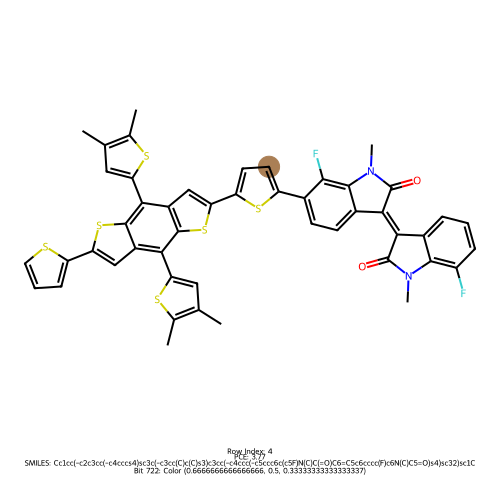

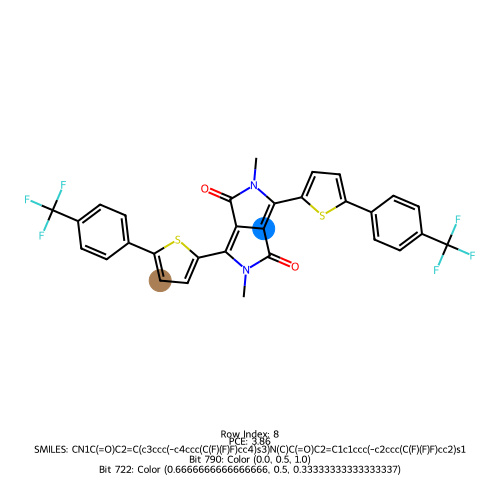

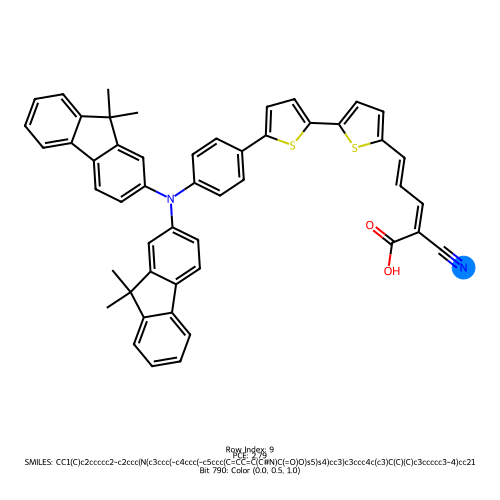

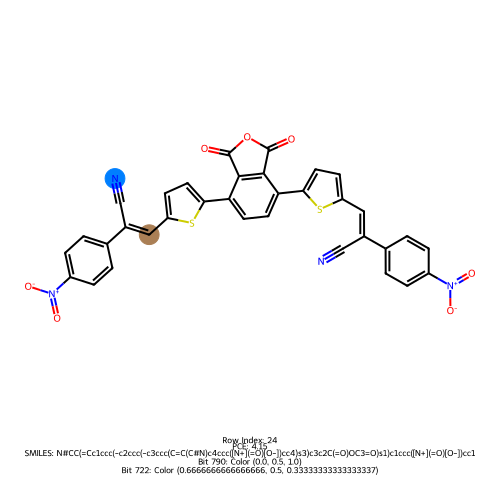

...

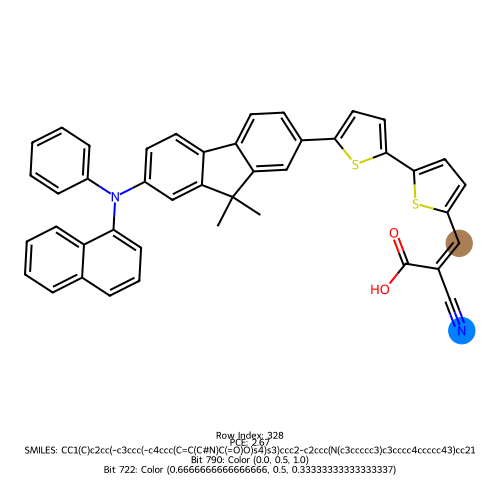

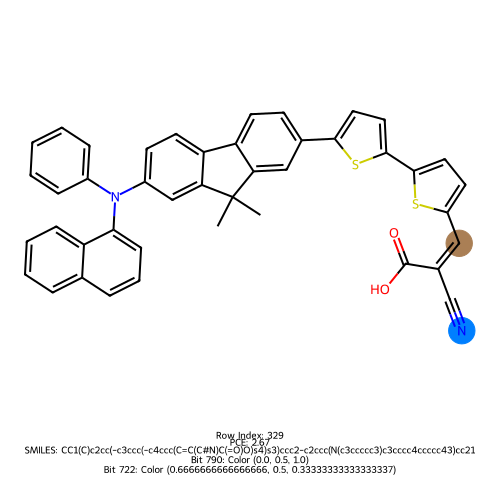

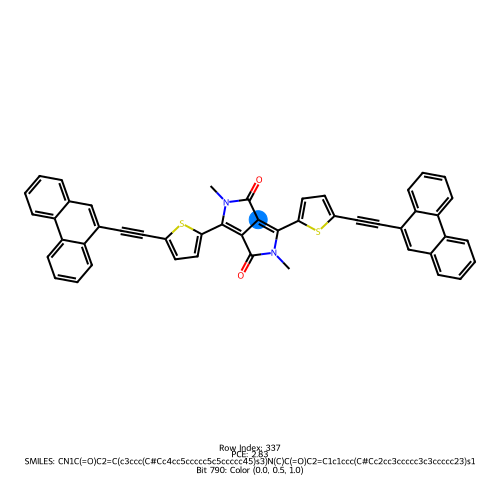

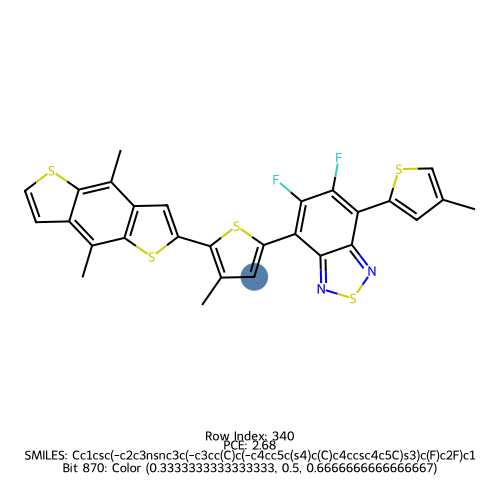

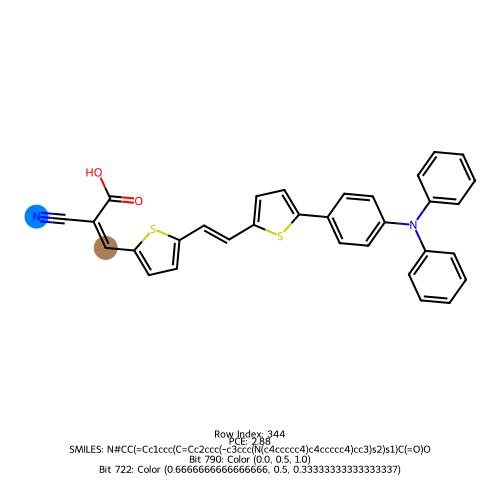

In [35]:
from rdkit import Chem
from rdkit.Chem import Draw
import pandas as pd
import ast
from IPython.display import SVG, display

# Load and merge data
df_smiles = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/no_negative_updated.csv')
df_bit_info = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info.csv')
df_bit_info.rename(columns={'smile': 'SMILES'}, inplace=True)
df = pd.merge(df_smiles, df_bit_info, on=['SMILES'], how='inner')

def filter_top_20_percent_pce_and_visualize(df, important_bits):
    """
    Filters molecules with PCE in the top 20%, visualizes specific substructures (bits),
    and adds color labels, PCE values, and row indices to the image.

    Parameters:
    - df: DataFrame containing 'SMILES', 'PCE', and 'bit_info' columns.
    - important_bits: List of bit positions corresponding to the desired substructures.

    Returns:
    - A list of dictionaries containing molecule data and visualizations for top 20% PCE molecules.
    """
    # Define unique colors for each bit
    bit_colors = {
        bit: (i / len(important_bits), 0.5, 1 - i / len(important_bits))
        for i, bit in enumerate(important_bits)
    }

    # Calculate the PCE threshold for the top 20%
    if 'PCE' not in df.columns:
        raise ValueError("PCE column is missing. Please verify your data.")
    pce_threshold = df['PCE'].quantile(0.8)
    print(f"Top 20% PCE threshold: {pce_threshold}")

    # Filter molecules with PCE in the top 20%
    high_pce_df = df[df['PCE'] >= pce_threshold]

    # Store results
    results = []

    for index, row in high_pce_df.iterrows():
        smiles = row['SMILES']
        mol = Chem.MolFromSmiles(smiles)
        
        try:
            bit_info = ast.literal_eval(row['bit_info'])
        except ValueError:
            print(f"Could not parse bit_info for SMILES: {smiles}")
            continue
        
        # Check if the molecule contains any of the important bits
        bits_present = [bit for bit in important_bits if bit in bit_info]

        if bits_present:
            # Highlight atoms and assign unique colors for each bit
            highlight_atoms = []
            highlight_colors = {}

            for bit in bits_present:
                atom_info = bit_info[bit][0][0]  # Extract atom indices for the bit
                if isinstance(atom_info, int):  # Single atom index
                    atom_indices = [atom_info]
                else:
                    atom_indices = atom_info

                # Add atom indices to the highlight list
                highlight_atoms.extend(atom_indices)

                # Assign the specific color to the atoms for this bit
                for atom in atom_indices:
                    highlight_colors[atom] = bit_colors[bit]

            # Create a legend for the molecule
            color_legend = "\n".join([f"Bit {bit}: Color {bit_colors[bit]}" for bit in bits_present])
            legend = (
                f"Row Index: {index}\nPCE: {row['PCE']:.2f}\n"
                f"SMILES: {smiles}\n{color_legend}"
            )

            # Draw the molecule with highlighted substructures
            drawer = Draw.rdMolDraw2D.MolDraw2DSVG(500, 500)
            drawer.drawOptions().legendFontSize = 14  # Adjust legend font size
            drawer.drawOptions().highlightRadius = 0.6  # Increase circle size
            Draw.rdDepictor.Compute2DCoords(mol)
            drawer.DrawMolecule(
                mol, 
                highlightAtoms=highlight_atoms, 
                highlightAtomColors=highlight_colors,
                legend=legend  # Add the legend here
            )
            drawer.FinishDrawing()

            # Render the SVG and display it
            svg = drawer.GetDrawingText()
            display(SVG(svg))  # Display the molecule visualization

            # Store the data for reference if needed
            results.append({"row_index": index, "smiles": smiles, "bits_present": bits_present, "pce": row['PCE'], "svg": svg})

    return results


# Define important bits
important_bits = [790, 870, 722]  # Specify your bits of interest

# Run the function
top_20_percent_visualizations = filter_top_20_percent_pce_and_visualize(df, important_bits)


Row Index: 137, PCE: 2.58, SMILES: CN1C(=O)C2=C(c3ccc(-c4cc5ccccc5o4)s3)N(C)C(=O)C2=C1c1ccc(-c2cc3ccccc3o2)s1
Visualizing Bit 390...


[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerat

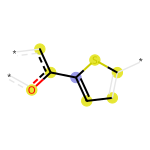

Row Index: 317, PCE: 2.716, SMILES: CC1(C)c2cc(C=C(C#N)C(=O)O)sc2-c2sc(-c3ccc(N(c4ccc(N5c6ccccc6Sc6ccccc65)cc4)c4ccc(N5c6ccccc6Sc6ccccc65)cc4)cc3)cc21
Visualizing Bit 390...


[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerat

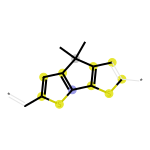

[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator
[17:01:37] DEPRECATION WARNING: please use MorganGenerator


In [7]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import AllChem
import pandas as pd
import ast
from IPython.display import SVG, display

# Load and merge data
df_smiles = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/no_negative_updated.csv')
df_bit_info = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info.csv')
df_bit_info.rename(columns={'smile': 'SMILES'}, inplace=True)
df = pd.merge(df_smiles, df_bit_info, on=['SMILES'], how='inner')

def visualize_morgan_bits(df, important_bits, radius=5, nBits=1024):
    """
    Visualizes substructures (bits) corresponding to Morgan fingerprints using Draw.DrawMorganBit().
    
    Parameters:
    - df: DataFrame containing 'SMILES', 'PCE', and 'bit_info' columns.
    - important_bits: List of bit positions corresponding to the desired substructures.
    - radius: Radius for Morgan fingerprint generation.
    - nBits: Number of bits for the Morgan fingerprint.

    Returns:
    - None. Displays the substructure visualization for each important bit.
    """
    pce_threshold = df['PCE'].quantile(0.8)

# Filter DataFrame to include only top 20% PCE molecules
    top_20_percent_df = df[df['PCE'] >= pce_threshold]

    for index, row in top_20_percent_df.iterrows():
        smiles = row['SMILES']
        mol = Chem.MolFromSmiles(smiles)
        bit_info = {}

        # Generate Morgan fingerprint and extract bitInfo
        AllChem.GetMorganFingerprintAsBitVect(mol, radius=radius, nBits=nBits, bitInfo=bit_info)

        # Check if the molecule contains any of the important bits
        bits_present = [bit for bit in important_bits if bit in bit_info]
        
        for bit in bits_present:
            print(f"Row Index: {index}, PCE: {row['PCE']}, SMILES: {smiles}")
            print(f"Visualizing Bit {bit}...")
            # Draw the substructure corresponding to the bit
            substructure_img = Draw.DrawMorganBit(mol, bit, bit_info)
            display(substructure_img)  # Display the visualization

# Define important bits
important_bits = [390]  # Replace with your bits of interest

# Visualize Morgan fingerprint substructures
visualize_morgan_bits(df, important_bits)


In [6]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import AllChem
import pandas as pd
from IPython.display import SVG, display

# Load and merge data
df_smiles = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/no_negative_updated.csv')
df_bit_info = pd.read_csv('/home/yxy220016/OPV project/Random Forest/Data/Data_processed/HOPV15_new/Fingerprint/Morgan_bit_info.csv')
df_bit_info.rename(columns={'smile': 'SMILES'}, inplace=True)
df = pd.merge(df_smiles, df_bit_info, on=['SMILES'], how='inner')
pce_threshold = df['PCE'].quantile(0.9)

# Filter DataFrame to include only top 20% PCE molecules
top_20_percent_df = df[df['PCE'] >= pce_threshold]
def visualize_morgan_bits_with_smarts_check(df, important_bits, radius=5, nBits=1024):
    """
    Visualizes substructures (bits) corresponding to Morgan fingerprints using Draw.DrawMorganBit().
    Checks for the presence of specified SMARTS patterns within molecules.

    Parameters:
    - df: DataFrame containing 'SMILES', 'PCE', and 'bit_info' columns.
    - important_bits: List of bit positions corresponding to the desired substructures.
    - radius: Radius for Morgan fingerprint generation.
    - nBits: Number of bits for the Morgan fingerprint.

    Returns:
    - None. Displays the substructure visualization for each important bit and reports SMARTS matches.
    """
    # Define SMARTS patterns for PubChem fingerprints
    smarts_patterns = {
        "PubchemFP340": "[#6]([#6])([#6])[#7]",  # Represents C(~C)(~C)(~N)
        "PubchemFP14": "[#7]",               # Represents the presence of at least one nitrogen atom (N)
        "PubchemFP473": "[#16]-[#6]:[#7]:[#6]"   # Represents S-C:N:C
    }

    # Iterate through the DataFrame
    for index, row in df.iterrows():
        smiles = row['SMILES']
        mol = Chem.MolFromSmiles(smiles)
        bit_info = {}
        
        # Generate Morgan fingerprint and extract bitInfo
        AllChem.GetMorganFingerprintAsBitVect(mol, radius=radius, nBits=nBits, bitInfo=bit_info)

        # Check if the molecule contains any of the important bits
        bits_present = [bit for bit in important_bits if bit in bit_info]
        
        if bits_present:
            print(f"Row Index: {index}, PCE: {row['PCE']:.2f}, SMILES: {smiles}")
            print(f"Bits Present: {bits_present}\n")

        # Check for SMARTS patterns in the molecule
            for structure_name, smarts in smarts_patterns.items():
                substructure_mol = Chem.MolFromSmarts(smarts)
                if mol.HasSubstructMatch(substructure_mol):
                    print(f"Substructure Found: {structure_name} ({smarts})\n")

            # Visualize each Morgan bit
            for bit in bits_present:
                print(f"Visualizing Bit {bit}...")
                
                # Highlight the central atom
                central_atom_idx = bit_info[bit][0][0]  # Central atom index for the bit
                highlight_colors = {central_atom_idx: (1, 0, 0)}  # Highlight in red
                highlight_atoms = [central_atom_idx]  # Central atom only

                # Create a custom drawing
                drawer = Draw.rdMolDraw2D.MolDraw2DSVG(400, 400)
                drawer.drawOptions().highlightRadius = 0.6  # Standard highlight radius
                Draw.rdDepictor.Compute2DCoords(mol)
                drawer.DrawMolecule(
                    mol, 
                    highlightAtoms=highlight_atoms,
                    highlightAtomColors=highlight_colors
                )
                drawer.FinishDrawing()

                # Render and display the visualization
                svg = drawer.GetDrawingText()
                display(SVG(svg))  # Display the molecule visualization with highlighted central atom

# Define important bits
important_bits = [390]  # Replace with your bits of interest

# Visualize Morgan fingerprint substructures and check SMARTS patterns
visualize_morgan_bits_with_smarts_check(top_20_percent_df, important_bits)


[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerator
[16:58:33] DEPRECATION WARNING: please use MorganGenerat